In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import classification_report,precision_score, recall_score
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Data Information

In [2]:
df = pd.read_csv("Automobile.csv")
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


# Data Information

In [3]:
df.shape

(1000, 40)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

Data sets has object,integer and float values for various variables. 

In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

# List of Catcategorical & Numerical columns

In [6]:
numCol=[]
catCol=[]

for col in df.columns:
    if df[col].dtype=='O':
        catCol.append(col)
    else:
            numCol.append(col)

In [7]:
print("List of categorical columns:",catCol)
print("List of numerical columns:",numCol)

List of categorical columns: ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']
List of numerical columns: ['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', '_c39']


# Missing Value Analysis of Dataset

In [8]:
df.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [9]:
df[df.isna().sum(axis=1)>1]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39


Data sets has no missing or null values excepted _c39 columns.

# Check Duplicate,Repeated and Unknown values

In [10]:
df[df.duplicated()]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39


Datasets has no duplicate or repeated values for variables.

In [11]:
for i in catCol:
    print(i,"---%Null", (df[i].shape[0]-df[i].notnull().sum()) / df[i].shape[0]*100)
    print(df[i].value_counts())
    print("\n")

policy_bind_date ---%Null 0.0
05-08-1992    3
01-01-2006    3
28-04-1992    3
29-09-1999    2
28-01-2010    2
             ..
10-08-2006    1
15-08-2011    1
04-08-1997    1
28-04-2013    1
07-04-2010    1
Name: policy_bind_date, Length: 951, dtype: int64


policy_state ---%Null 0.0
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


policy_csl ---%Null 0.0
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


insured_sex ---%Null 0.0
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


insured_education_level ---%Null 0.0
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


insured_occupation ---%Null 0.0
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
priv-house-serv      71
other-service      

In [12]:
for i in numCol:
    print(i,"---%Null", (df[i].shape[0]-df[i].notnull().sum()) / df[i].shape[0]*100)
    print(df[i].value_counts())
    print("\n")

months_as_customer ---%Null 0.0
194    8
254    7
210    7
101    7
140    7
      ..
312    1
62     1
309    1
308    1
0      1
Name: months_as_customer, Length: 391, dtype: int64


age ---%Null 0.0
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
35    32
44    32
36    32
42    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
55    14
25    14
49    14
50    13
53    13
24    10
54    10
61    10
51     9
60     9
56     8
58     8
23     7
21     6
59     5
52     4
62     4
63     2
64     2
20     1
22     1
19     1
Name: age, dtype: int64


policy_number ---%Null 0.0
296960    1
206213    1
853360    1
521585    1
290162    1
         ..
276804    1
426708    1
963285    1
789208    1
116735    1
Name: policy_number, Length: 1000, dtype: int64


policy_deductable ---%Null 0.0
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64


policy_annual_premium ---%Null 0.0
1215.36

# Descriptive Statistics

In [13]:
df.describe(include='all')

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
count,1000.000000,1000.000000,1000.000000,1000,1000,1000,1000.000000,1000.000000,1.000000e+03,1000.000000,...,1000,1000.00000,1000.000000,1000.000000,1000.000000,1000,1000,1000.000000,1000,0.0
unique,NaN,NaN,NaN,951,3,3,NaN,NaN,NaN,NaN,...,3,NaN,NaN,NaN,NaN,14,39,NaN,2,NaN
top,NaN,NaN,NaN,05-08-1992,OH,250/500,NaN,NaN,NaN,NaN,...,NO,NaN,NaN,NaN,NaN,Suburu,RAM,NaN,N,NaN
freq,NaN,NaN,NaN,3,352,351,NaN,NaN,NaN,NaN,...,343,NaN,NaN,NaN,NaN,80,43,NaN,753,NaN
mean,203.954000,38.948000,546238.648000,NaN,NaN,NaN,1136.000000,1256.406150,1.101000e+06,501214.488000,...,NaN,52761.94000,7433.420000,7399.570000,37928.950000,NaN,NaN,2005.103000,NaN,NaN
std,115.113174,9.140287,257063.005276,NaN,NaN,NaN,611.864673,244.167395,2.297407e+06,71701.610941,...,NaN,26401.53319,4880.951853,4824.726179,18886.252893,NaN,NaN,6.015861,NaN,NaN
min,0.000000,19.000000,100804.000000,NaN,NaN,NaN,500.000000,433.330000,-1.000000e+06,430104.000000,...,NaN,100.00000,0.000000,0.000000,70.000000,NaN,NaN,1995.000000,NaN,NaN
25%,115.750000,32.000000,335980.250000,NaN,NaN,NaN,500.000000,1089.607500,0.000000e+00,448404.500000,...,NaN,41812.50000,4295.000000,4445.000000,30292.500000,NaN,NaN,2000.000000,NaN,NaN
50%,199.500000,38.000000,533135.000000,NaN,NaN,NaN,1000.000000,1257.200000,0.000000e+00,466445.500000,...,NaN,58055.00000,6775.000000,6750.000000,42100.000000,NaN,NaN,2005.000000,NaN,NaN
75%,276.250000,44.000000,759099.750000,NaN,NaN,NaN,2000.000000,1415.695000,0.000000e+00,603251.000000,...,NaN,70592.50000,11305.000000,10885.000000,50822.500000,NaN,NaN,2010.000000,NaN,NaN


Measures of Central Tendency shows the mean,Standard Deviation,min and max limits,mean,median,mode of various variables present in datasets. 

In [14]:
df[numCol].describe

<bound method NDFrame.describe of      months_as_customer  age  policy_number  policy_deductable  \
0                   328   48         521585               1000   
1                   228   42         342868               2000   
2                   134   29         687698               2000   
3                   256   41         227811               2000   
4                   228   44         367455               1000   
..                  ...  ...            ...                ...   
995                   3   38         941851               1000   
996                 285   41         186934               1000   
997                 130   34         918516                500   
998                 458   62         533940               2000   
999                 456   60         556080               1000   

     policy_annual_premium  umbrella_limit  insured_zip  capital-gains  \
0                  1406.91               0       466132          53300   
1                  1197.2

In [15]:
df[catCol].describe

<bound method NDFrame.describe of     policy_bind_date policy_state policy_csl insured_sex  \
0         17-10-2014           OH    250/500        MALE   
1         27-06-2006           IN    250/500        MALE   
2         06-09-2000           OH    100/300      FEMALE   
3         25-05-1990           IL    250/500      FEMALE   
4         06-06-2014           IL   500/1000        MALE   
..               ...          ...        ...         ...   
995       16-07-1991           OH   500/1000      FEMALE   
996       05-01-2014           IL    100/300      FEMALE   
997       17-02-2003           OH    250/500      FEMALE   
998       18-11-2011           IL   500/1000        MALE   
999       11-11-1996           OH    250/500      FEMALE   

    insured_education_level insured_occupation insured_hobbies  \
0                        MD       craft-repair        sleeping   
1                        MD  machine-op-inspct         reading   
2                       PhD              sales 

In [16]:
df[catCol].describe().T

,count,unique,top,freq
policy_bind_date,1000,951,05-08-1992,3
policy_state,1000,3,OH,352
policy_csl,1000,3,250/500,351
insured_sex,1000,2,FEMALE,537
insured_education_level,1000,7,JD,161
insured_occupation,1000,14,machine-op-inspct,93
insured_hobbies,1000,20,reading,64
insured_relationship,1000,6,own-child,183
incident_date,1000,60,02-02-2015,28
incident_type,1000,4,Multi-vehicle Collision,419


# Univariate Analysis

In [17]:
for i in catCol:
    print(i)
    print(df[i].nunique())
    print(df[i].value_counts())
    print("\n")

policy_bind_date
951
05-08-1992    3
01-01-2006    3
28-04-1992    3
29-09-1999    2
28-01-2010    2
             ..
10-08-2006    1
15-08-2011    1
04-08-1997    1
28-04-2013    1
07-04-2010    1
Name: policy_bind_date, Length: 951, dtype: int64


policy_state
3
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


policy_csl
3
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


insured_sex
2
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


insured_education_level
7
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


insured_occupation
14
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
priv-house-serv      71
other-service        71
armed-forces         69
adm-clerical         65
protective

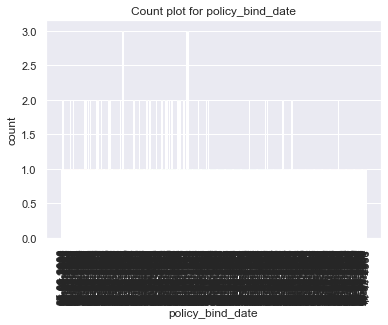

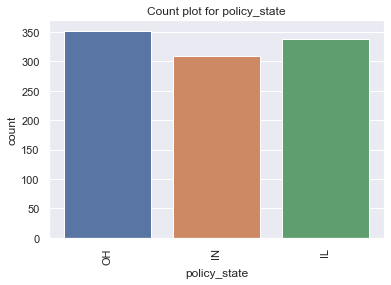

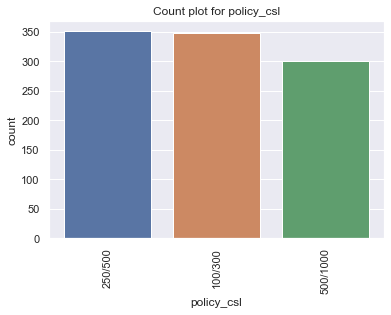

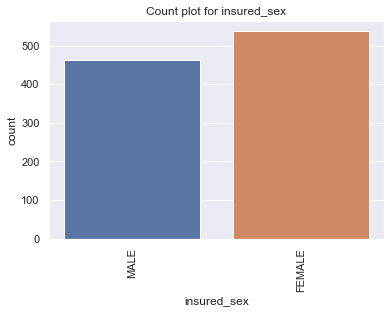

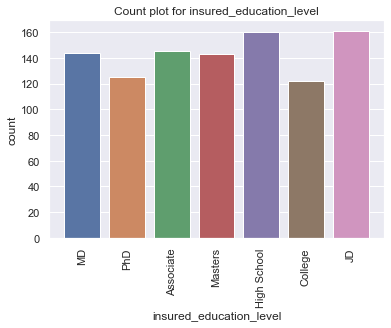

...

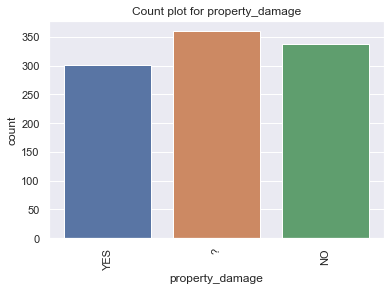

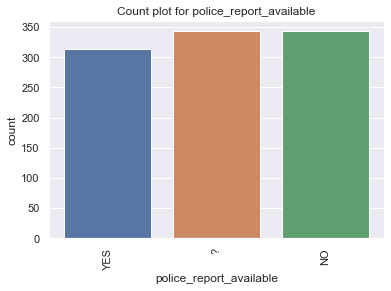

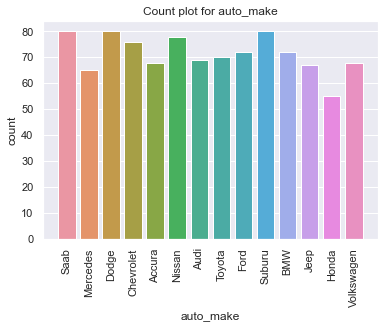

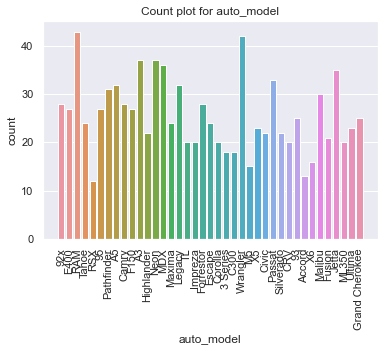

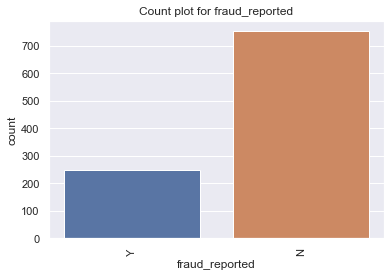

In [18]:
for i in catCol:
    plt.figure()
    sns.set_theme(style="darkgrid")
    sns.countplot(df[i])
    plt.xticks(rotation=90)
    plt.title(f"Count plot for {i}")
    plt.plot()
    plt.show()

In [19]:
for i in numCol:
    print(i)
    print(df[i].nunique())
    print(df[i].value_counts())
    print("\n")

months_as_customer
391
194    8
254    7
210    7
101    7
140    7
      ..
312    1
62     1
309    1
308    1
0      1
Name: months_as_customer, Length: 391, dtype: int64


age
46
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
35    32
44    32
36    32
42    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
55    14
25    14
49    14
50    13
53    13
24    10
54    10
61    10
51     9
60     9
56     8
58     8
23     7
21     6
59     5
52     4
62     4
63     2
64     2
20     1
22     1
19     1
Name: age, dtype: int64


policy_number
1000
296960    1
206213    1
853360    1
521585    1
290162    1
         ..
276804    1
426708    1
963285    1
789208    1
116735    1
Name: policy_number, Length: 1000, dtype: int64


policy_deductable
3
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64


policy_annual_premium
991
1215.36    2
1374.22    2
1389.13    2
1281.25    2
10

<Figure size 432x288 with 0 Axes>

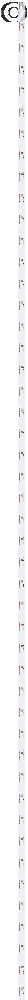

<Figure size 432x288 with 0 Axes>

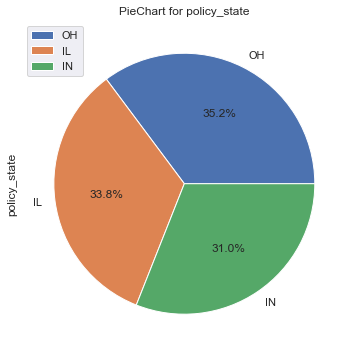

<Figure size 432x288 with 0 Axes>

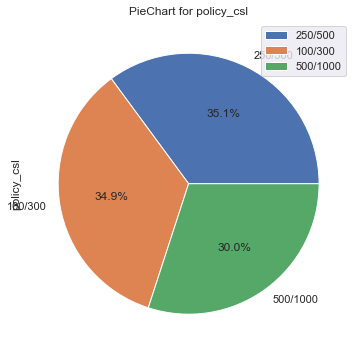

<Figure size 432x288 with 0 Axes>

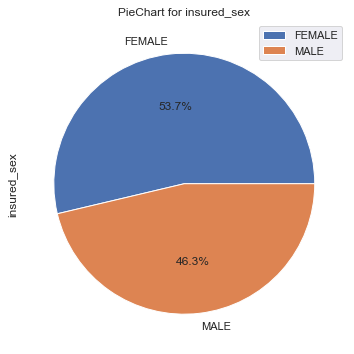

<Figure size 432x288 with 0 Axes>

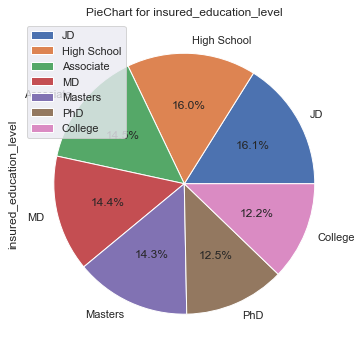

<Figure size 432x288 with 0 Axes>

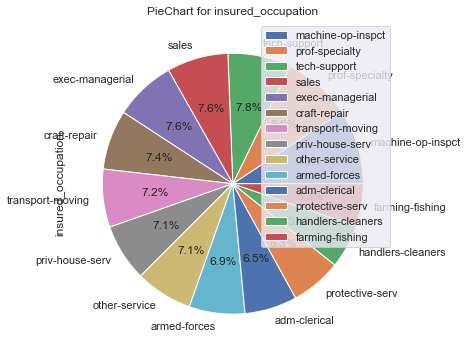

<Figure size 432x288 with 0 Axes>

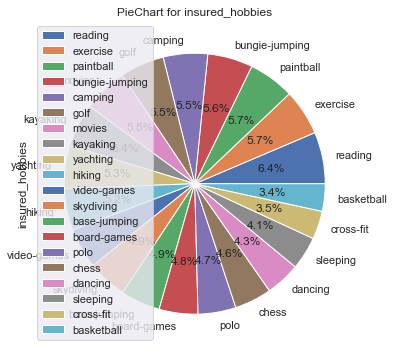

<Figure size 432x288 with 0 Axes>

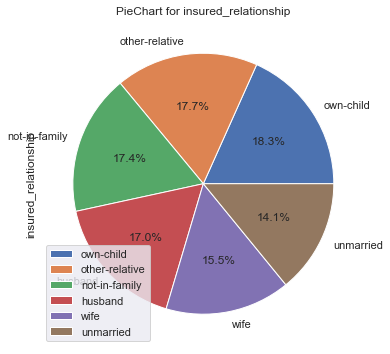

<Figure size 432x288 with 0 Axes>

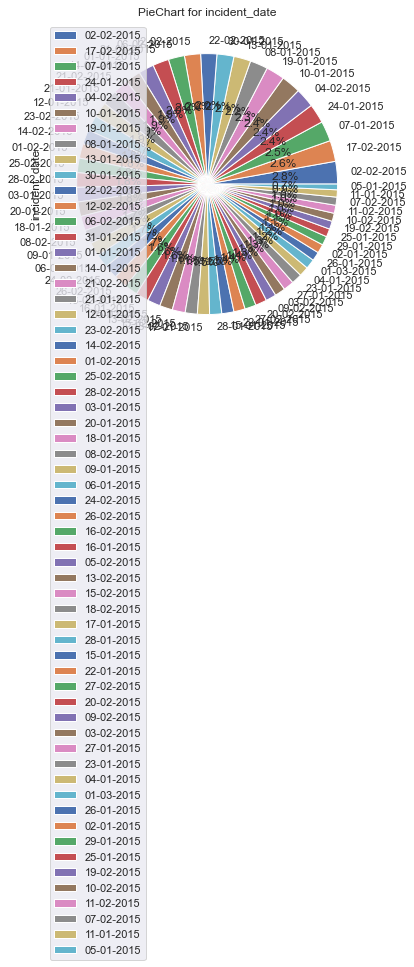

<Figure size 432x288 with 0 Axes>

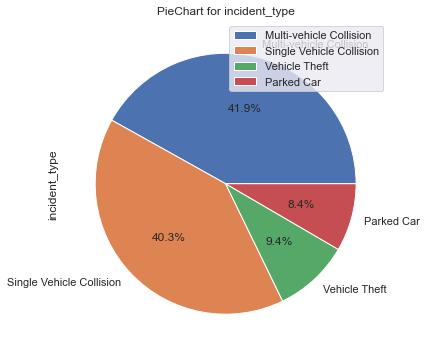

<Figure size 432x288 with 0 Axes>

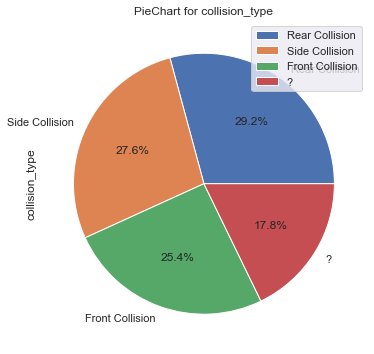

<Figure size 432x288 with 0 Axes>

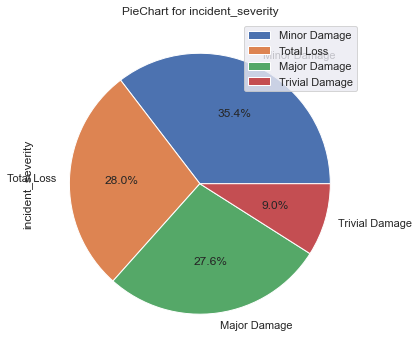

<Figure size 432x288 with 0 Axes>

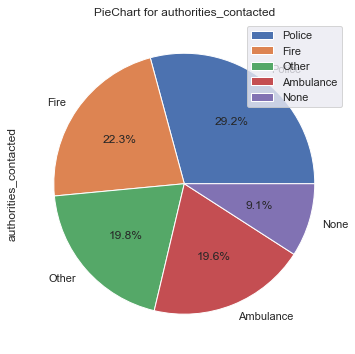

<Figure size 432x288 with 0 Axes>

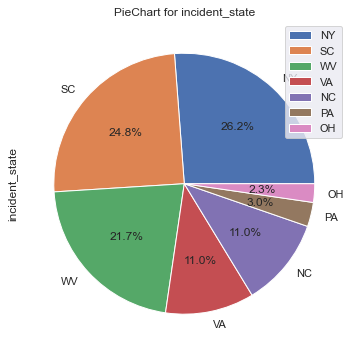

<Figure size 432x288 with 0 Axes>

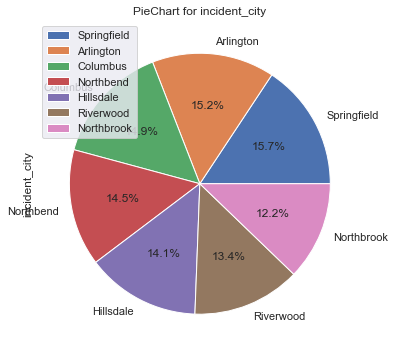

<Figure size 432x288 with 0 Axes>

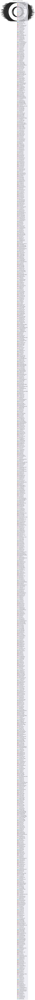

<Figure size 432x288 with 0 Axes>

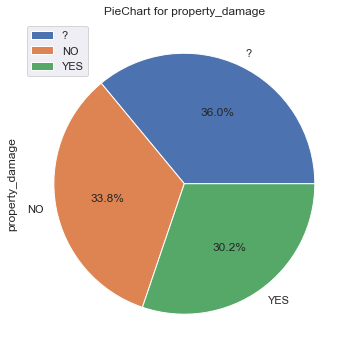

<Figure size 432x288 with 0 Axes>

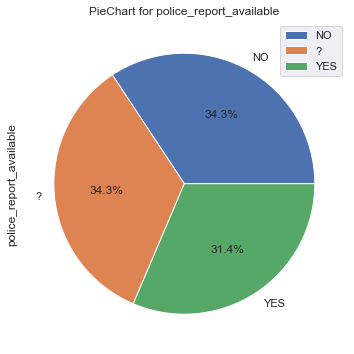

<Figure size 432x288 with 0 Axes>

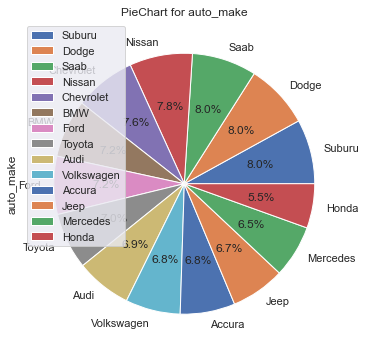

<Figure size 432x288 with 0 Axes>

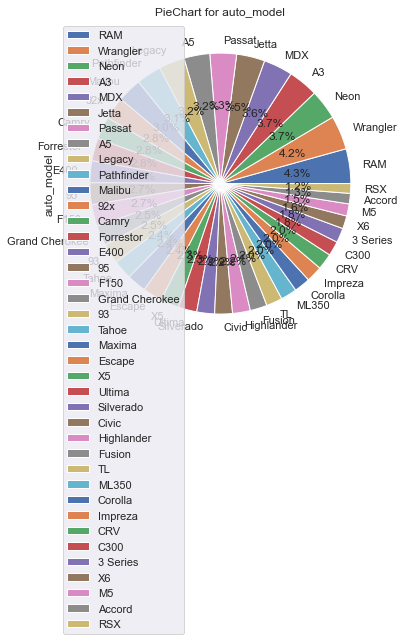

<Figure size 432x288 with 0 Axes>

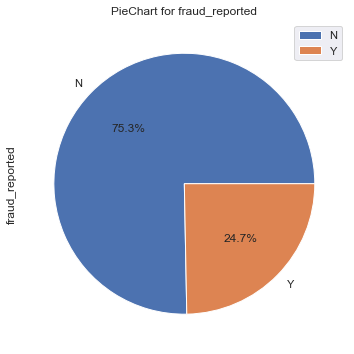

In [20]:
for i in catCol:
    plt.figure()
    sns.set_theme(style="darkgrid")
    countsDF= pd.DataFrame(df[i].value_counts())
    plot= countsDF.plot.pie(subplots=True,autopct="%.1f%%",figsize=(11,6))
    plt.title(f"PieChart for {i}")
    plt.plot()
    plt.show()

months_as_customer


<Figure size 432x288 with 0 Axes>

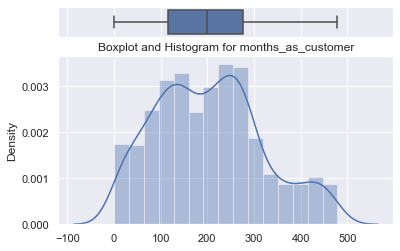

age


<Figure size 432x288 with 0 Axes>

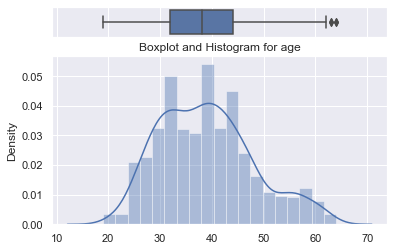

policy_number


<Figure size 432x288 with 0 Axes>

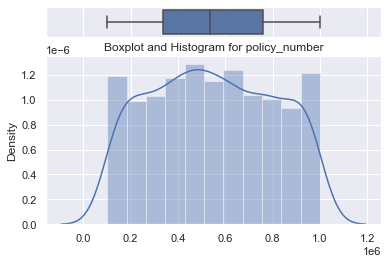

policy_deductable


<Figure size 432x288 with 0 Axes>

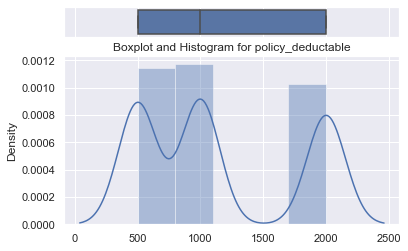

policy_annual_premium


<Figure size 432x288 with 0 Axes>

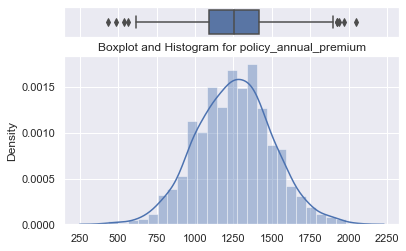

umbrella_limit


<Figure size 432x288 with 0 Axes>

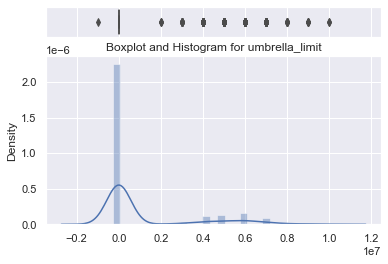

insured_zip


<Figure size 432x288 with 0 Axes>

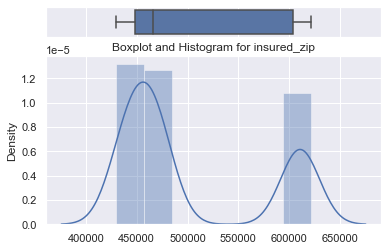

capital-gains


<Figure size 432x288 with 0 Axes>

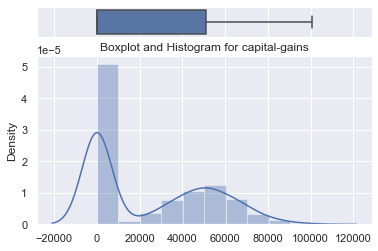

capital-loss


<Figure size 432x288 with 0 Axes>

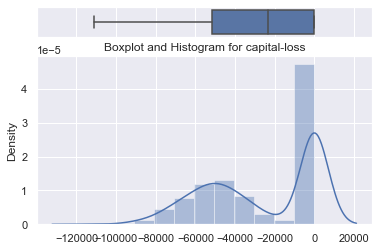

incident_hour_of_the_day


<Figure size 432x288 with 0 Axes>

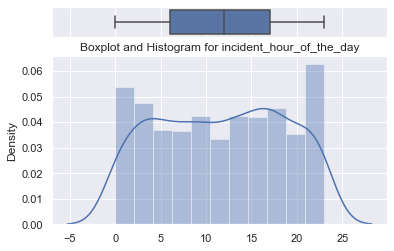

number_of_vehicles_involved


<Figure size 432x288 with 0 Axes>

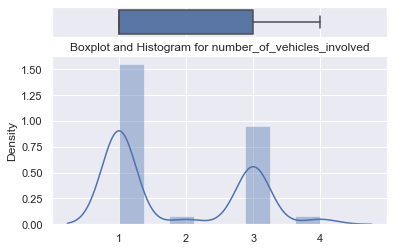

bodily_injuries


<Figure size 432x288 with 0 Axes>

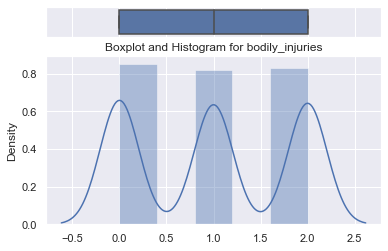

witnesses


<Figure size 432x288 with 0 Axes>

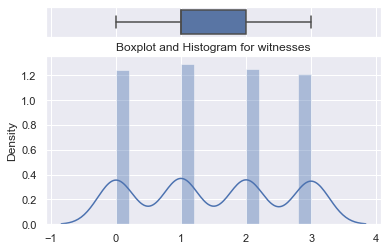

total_claim_amount


<Figure size 432x288 with 0 Axes>

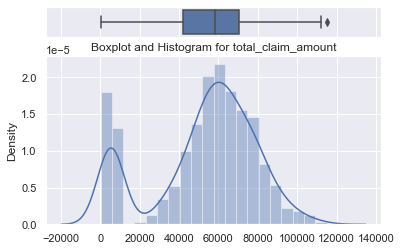

injury_claim


<Figure size 432x288 with 0 Axes>

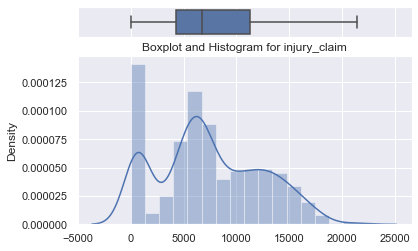

property_claim


<Figure size 432x288 with 0 Axes>

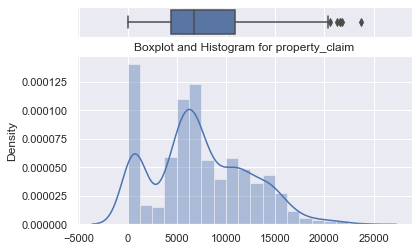

vehicle_claim


<Figure size 432x288 with 0 Axes>

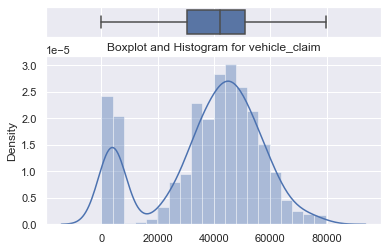

auto_year


<Figure size 432x288 with 0 Axes>

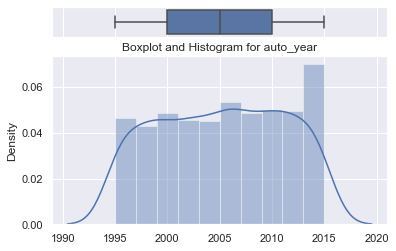

_c39


<Figure size 432x288 with 0 Axes>

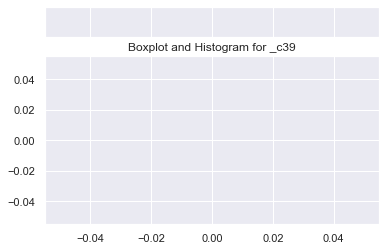

In [21]:
for i in numCol:
    print(i)
    plt.figure()
    sns.set_theme(style="darkgrid")
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios":(.15,.85)})
    sns.boxplot(x = df[i],ax=ax_box)
    #sns.histplot (data=df, x=i, ax=ax_hist)
    sns.distplot(x= df[i],ax=ax_hist)
    ax_box.set(xlabel='')
    plt.plot()
    plt.title(f"Boxplot and Histogram for {i}")
    plt.show()

In [22]:
pd.DataFrame(df.skew(axis=0,skipna=True))

,0
months_as_customer,0.362177
age,0.478988
policy_number,0.038991
policy_deductable,0.477887
policy_annual_premium,0.004402
umbrella_limit,1.806712
insured_zip,0.816554
capital-gains,0.478850
capital-loss,-0.391472
incident_hour_of_the_day,-0.035584


# For Skewness

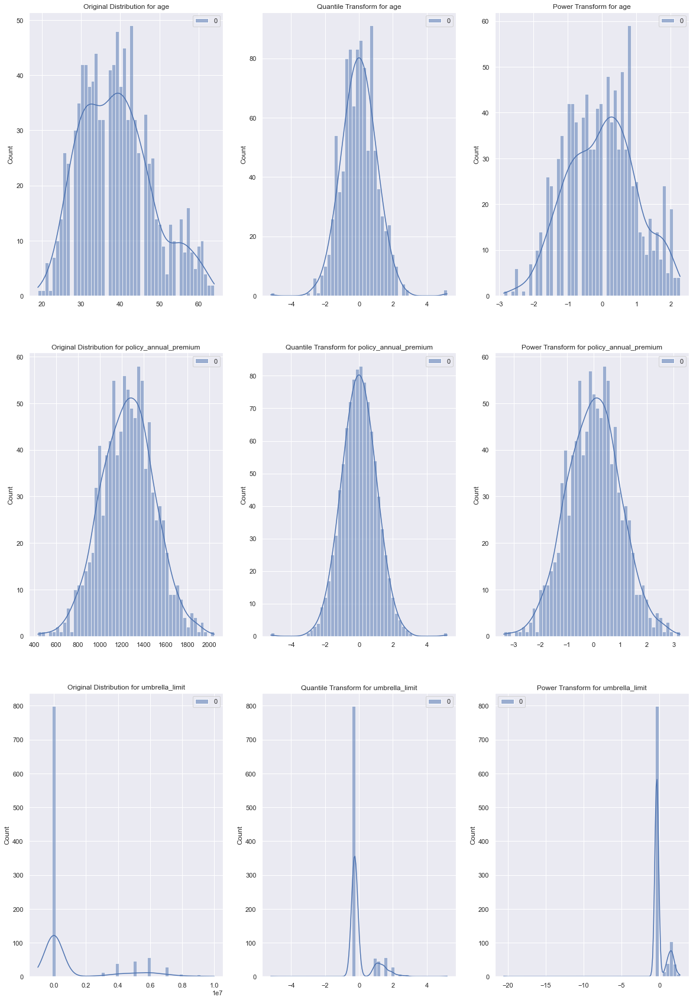

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd 
from sklearn.preprocessing import PowerTransformer, QuantileTransformer
cols1 = ["age", "policy_annual_premium", "umbrella_limit"]
def test_transformers(columns):
    pt = PowerTransformer()
    qt = QuantileTransformer(n_quantiles=500, output_distribution='normal')
    fig = plt.figure(figsize=(20,30))
    j = 1
    for i in columns:
        array = np.array(df[i]).reshape(-1, 1)
        y = pt.fit_transform(array)
        x = qt.fit_transform(array)
        plt.subplot(3,3,j)
        sns.histplot(array, bins = 50, kde = True)
        plt.title(f"Original Distribution for {i}")
        plt.subplot(3,3,j+1)
        sns.histplot(x, bins = 50, kde = True)
        plt.title(f"Quantile Transform for {i}")
        plt.subplot(3,3,j+2)
        sns.histplot(y, bins = 50, kde = True)
        plt.title(f"Power Transform for {i}")
        j += 3
test_transformers(cols1)

# Multivariate Analysis

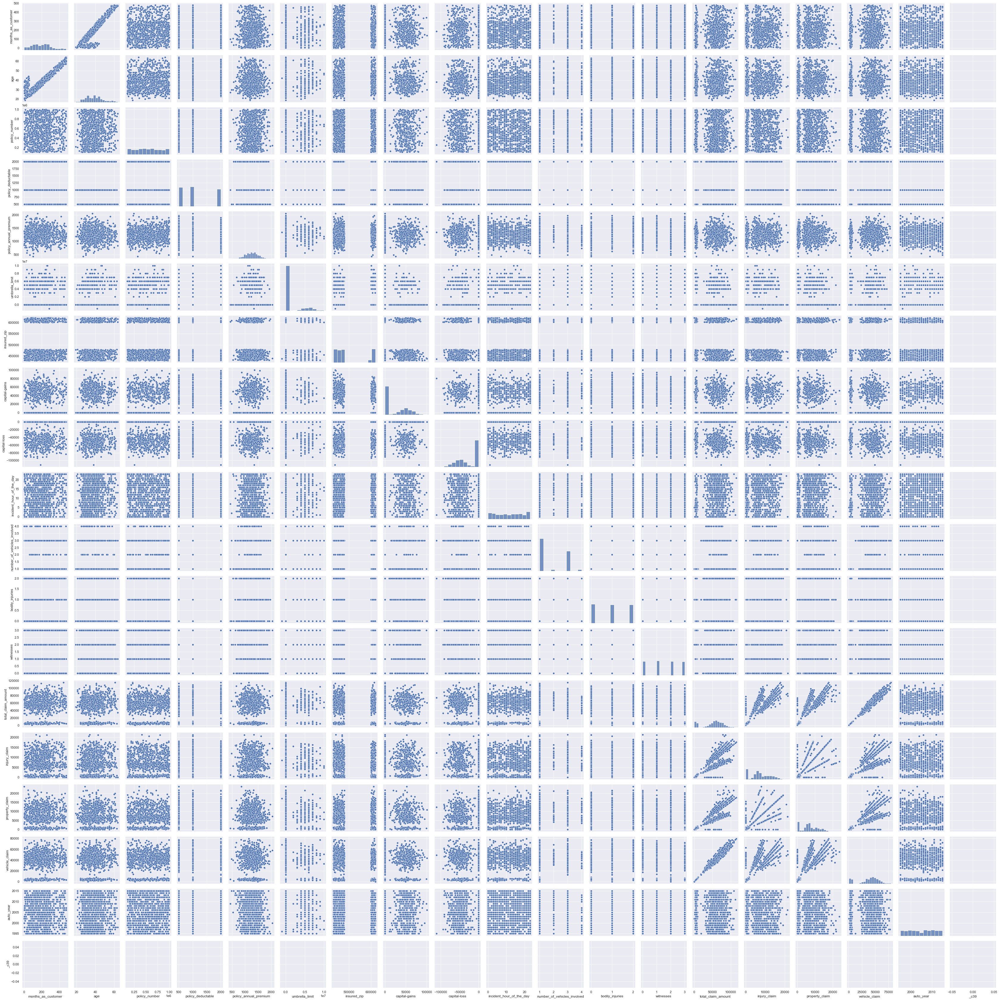

In [24]:
sns.pairplot(df)
plt.plot()
plt.show()

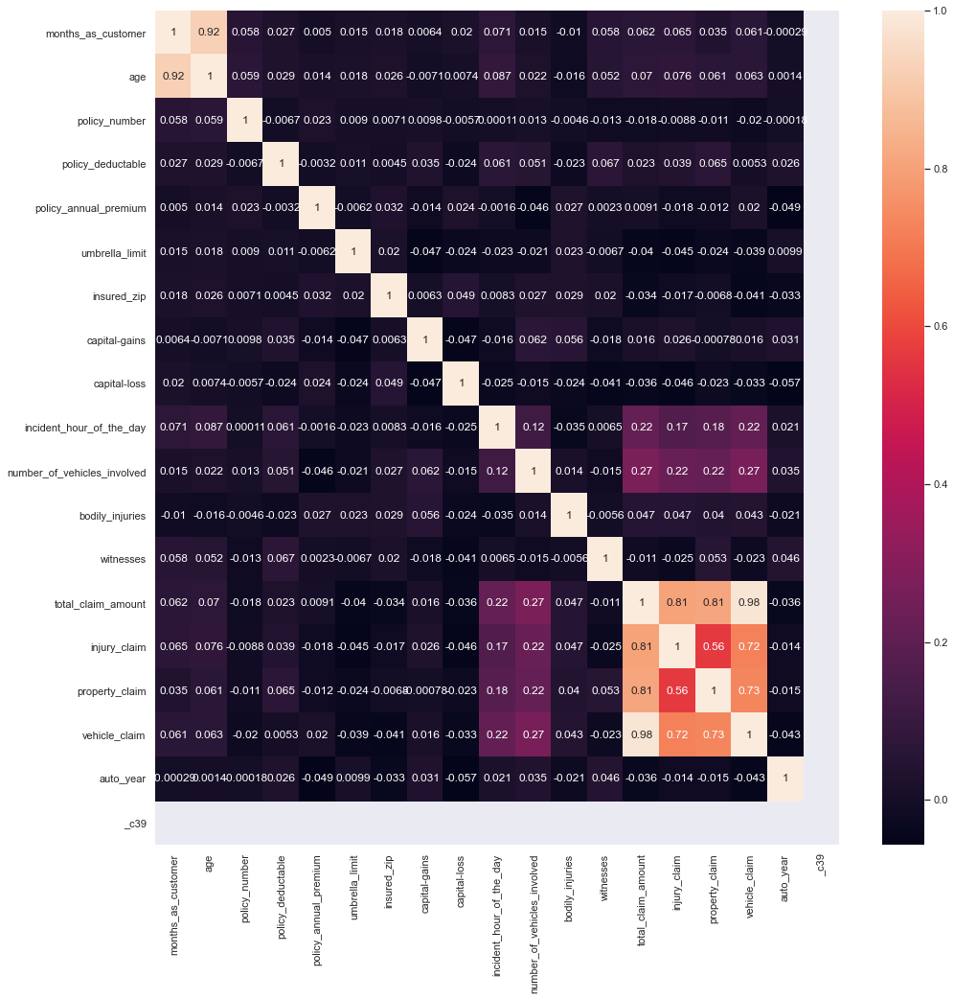

In [25]:
plt.figure(figsize= (16,16))
sns.heatmap(df.corr(),annot=True)
plt.show()

# Min-Max Sacaling

In [26]:
from sklearn.preprocessing import MinMaxScaler
MinMaxscaler=MinMaxScaler()
MinMax=MinMaxscaler.fit_transform(df[numCol])
print(MinMax)

[[0.68475992 0.64444444 0.4682467  ... 0.65429614 0.45              nan]
 [0.47599165 0.51111111 0.26936974 ... 0.04327588 0.6               nan]
 [0.27974948 0.22222222 0.65309788 ... 0.28972198 0.6               nan]
 ...
 [0.27139875 0.33333333 0.90995303 ... 0.65957982 0.05              nan]
 [0.95615866 0.95555556 0.48199539 ... 0.45879985 0.15              nan]
 [0.9519833  0.91111111 0.50663287 ... 0.04541452 0.6               nan]]


In [27]:
df[numCol]

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,13020,52080,2004,NaN
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,780,3510,2007,NaN
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,3850,23100,2007,NaN
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,6340,50720,2014,NaN
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,650,4550,2009,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,20,1,0,1,87200,17440,8720,61040,2006,NaN
996,285,41,186934,1000,1436.79,0,608177,70900,0,23,1,2,3,108480,18080,18080,72320,2015,NaN
997,130,34,918516,500,1383.49,3000000,442797,35100,0,4,3,2,3,67500,7500,7500,52500,1996,NaN
998,458,62,533940,2000,1356.92,5000000,441714,0,0,2,1,0,1,46980,5220,5220,36540,1998,NaN


In [28]:
minMaxDF=pd.DataFrame(MinMax,columns=numCol)
minMaxDF

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
0,0.684760,0.644444,0.468247,0.333333,0.603112,0.090909,0.188769,0.530348,1.000000,0.217391,0.000000,0.5,0.666667,0.622801,0.303497,0.550063,0.654296,0.45,NaN
1,0.475992,0.511111,0.269370,1.000000,0.473214,0.545455,0.199478,0.000000,1.000000,0.347826,0.000000,0.0,0.000000,0.043285,0.036364,0.032953,0.043276,0.60,NaN
2,0.279749,0.222222,0.653098,1.000000,0.606972,0.545455,0.002766,0.349254,1.000000,0.304348,0.666667,1.0,1.000000,0.300906,0.358974,0.162653,0.289722,0.60,NaN
3,0.534447,0.488889,0.141334,1.000000,0.608582,0.636364,0.932699,0.486567,0.438344,0.217391,0.000000,0.5,0.666667,0.551298,0.295571,0.267850,0.637187,0.95,NaN
4,0.475992,0.555556,0.296730,0.333333,0.712760,0.636364,0.946264,0.656716,0.585959,0.869565,0.000000,0.0,0.333333,0.055739,0.060606,0.027461,0.056359,0.70,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.006263,0.422222,0.935920,0.333333,0.543574,0.090909,0.006209,0.000000,1.000000,0.869565,0.000000,0.0,0.333333,0.758579,0.813054,0.368399,0.767015,0.55,NaN
996,0.594990,0.488889,0.095846,0.333333,0.621622,0.090909,0.933013,0.705473,1.000000,1.000000,0.000000,1.0,1.000000,0.943912,0.842890,0.763836,0.908919,1.00,NaN
997,0.271399,0.333333,0.909953,0.000000,0.588604,0.363636,0.066505,0.349254,1.000000,0.173913,0.666667,1.0,1.000000,0.587006,0.349650,0.316857,0.659580,0.05,NaN
998,0.956159,0.955556,0.481995,1.000000,0.572145,0.545455,0.060831,0.000000,1.000000,0.086957,0.000000,0.0,0.333333,0.408291,0.243357,0.220532,0.458800,0.15,NaN


In [29]:
minMaxDF.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,0.425791,0.240320,0.0,0.241649,0.416493,0.576722,1.0
age,1000.0,0.443289,0.203117,0.0,0.288889,0.422222,0.555556,1.0
policy_number,1000.0,0.495681,0.286061,0.0,0.261705,0.481100,0.732554,1.0
policy_deductable,1000.0,0.424000,0.407910,0.0,0.000000,0.333333,1.000000,1.0
policy_annual_premium,1000.0,0.509878,0.151257,0.0,0.406550,0.510370,0.608554,1.0
umbrella_limit,1000.0,0.191000,0.208855,0.0,0.090909,0.090909,0.090909,1.0
insured_zip,1000.0,0.372583,0.375680,0.0,0.095885,0.190411,0.907203,1.0
capital-gains,1000.0,0.250011,0.277335,0.0,0.000000,0.000000,0.507711,1.0
capital-loss,1000.0,0.758833,0.252962,0.0,0.536454,0.790729,1.000000,1.0
incident_hour_of_the_day,1000.0,0.506261,0.302234,0.0,0.260870,0.521739,0.739130,1.0


In [30]:
df[numCol].describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,2.039540e+02,1.151132e+02,0.00,115.7500,199.5,276.250,479.00
age,1000.0,3.894800e+01,9.140287e+00,19.00,32.0000,38.0,44.000,64.00
policy_number,1000.0,5.462386e+05,2.570630e+05,100804.00,335980.2500,533135.0,759099.750,999435.00
policy_deductable,1000.0,1.136000e+03,6.118647e+02,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1.256406e+03,2.441674e+02,433.33,1089.6075,1257.2,1415.695,2047.59
umbrella_limit,1000.0,1.101000e+06,2.297407e+06,-1000000.00,0.0000,0.0,0.000,10000000.00
insured_zip,1000.0,5.012145e+05,7.170161e+04,430104.00,448404.5000,466445.5,603251.000,620962.00
capital-gains,1000.0,2.512610e+04,2.787219e+04,0.00,0.0000,0.0,51025.000,100500.00
capital-loss,1000.0,-2.679370e+04,2.810410e+04,-111100.00,-51500.0000,-23250.0,0.000,0.00
incident_hour_of_the_day,1000.0,1.164400e+01,6.951373e+00,0.00,6.0000,12.0,17.000,23.00


# Standardization

In [31]:
from sklearn.preprocessing import StandardScaler
stdscaler=StandardScaler()
stdscaled=stdscaler.fit_transform(df[numCol])
print(stdscaled)

[[ 1.07813958  0.99083647 -0.09595307 ...  0.74965272 -0.1834404
          nan]
 [ 0.2089946   0.33407345 -0.79152739 ... -1.82334593  0.31549088
          nan]
 [-0.60800168 -1.08891308  0.55056594 ... -0.78556451  0.31549088
          nan]
 ...
 [-0.64276748 -0.54161057  1.44891961 ...  0.77190224 -1.5139238
          nan]
 [ 2.20802805  2.52328351 -0.04786687 ... -0.07357971 -1.18130295
          nan]
 [ 2.19064515  2.3043625   0.03830297 ... -1.81434017  0.31549088
          nan]]


In [32]:
stdscaledDF= pd.DataFrame(stdscaled,columns=numCol)
stdscaledDF

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
0,1.078140,0.990836,-0.095953,-0.222383,0.616705,-0.479476,-0.489529,1.011331,0.953851,-0.956261,-0.823865,0.009759,0.461838,0.714257,-0.189283,1.165505,0.749653,-0.183440,NaN
1,0.208995,0.334073,-0.791527,1.412784,-0.242521,1.697980,-0.461008,-0.901927,0.953851,-0.524475,-0.823865,-1.210174,-1.338700,-1.807312,-1.363822,-1.372696,-1.823346,0.315491,NaN
2,-0.608002,-1.088913,0.550566,1.412784,0.642233,1.697980,-0.984885,0.358023,0.953851,-0.668404,1.140056,1.229693,1.362107,-0.686362,0.054644,-0.736072,-0.785565,0.315491,NaN
3,0.452355,0.224613,-1.239334,1.412784,0.652886,2.133471,1.491682,0.853388,-1.267577,-0.956261,-0.823865,0.009759,0.461838,0.403135,-0.224130,-0.219722,0.677607,1.479664,NaN
4,0.208995,0.552994,-0.695834,-0.222383,1.341980,2.133471,1.527808,1.467210,-0.683741,1.202666,-0.823865,-1.210174,-0.438431,-1.753121,-1.257232,-1.399654,-1.768252,0.648112,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-1.746582,-0.103769,1.539740,-0.222383,0.222884,-0.479476,-0.975717,-0.901927,0.953851,1.202666,-0.823865,-1.210174,-0.438431,1.305049,2.051155,0.273817,1.224309,0.149180,NaN
996,0.704407,0.224613,-1.398429,-0.222383,0.739141,-0.479476,1.492519,1.643100,0.953851,1.634452,-0.823865,1.229693,1.362107,2.111466,2.182342,2.214794,1.821868,1.645974,NaN
997,-0.642767,-0.541611,1.448920,-1.039966,0.520739,0.826998,-0.815138,0.358023,0.953851,-1.100189,1.140056,1.229693,1.362107,0.558507,0.013648,0.020826,0.771902,-1.513924,NaN
998,2.208028,2.523284,-0.047867,1.412784,0.411866,1.697980,-0.830250,-0.901927,0.953851,-1.388046,-0.823865,-1.210174,-0.438431,-0.219110,-0.453708,-0.451976,-0.073580,-1.181303,NaN


In [33]:
df[numCol]

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,13020,52080,2004,NaN
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,780,3510,2007,NaN
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,3850,23100,2007,NaN
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,6340,50720,2014,NaN
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,650,4550,2009,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,20,1,0,1,87200,17440,8720,61040,2006,NaN
996,285,41,186934,1000,1436.79,0,608177,70900,0,23,1,2,3,108480,18080,18080,72320,2015,NaN
997,130,34,918516,500,1383.49,3000000,442797,35100,0,4,3,2,3,67500,7500,7500,52500,1996,NaN
998,458,62,533940,2000,1356.92,5000000,441714,0,0,2,1,0,1,46980,5220,5220,36540,1998,NaN


In [34]:
stdscaledDF.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,-7.505108e-17,1.0005,-1.772656,-0.766621,-0.038712,0.628357,2.390548
age,1000.0,-3.863576e-17,1.0005,-2.183518,-0.760532,-0.103769,0.552994,2.742205
policy_number,1000.0,-2.094991e-16,1.0005,-1.733651,-0.818335,-0.051000,0.828465,1.763860
policy_deductable,1000.0,-3.486378e-16,1.0005,-1.039966,-1.039966,-0.222383,1.412784,1.412784
policy_annual_premium,1000.0,8.184564e-16,1.0005,-3.372637,-0.683474,0.003253,0.652702,3.241955
umbrella_limit,1000.0,1.343370e-16,1.0005,-0.914967,-0.479476,-0.479476,-0.479476,3.875436
insured_zip,1000.0,-1.583178e-16,1.0005,-0.992252,-0.736893,-0.485155,1.423783,1.670917
capital-gains,1000.0,2.819966e-17,1.0005,-0.901927,-0.901927,-0.901927,0.929667,2.705622
capital-loss,1000.0,1.538769e-16,1.0005,-3.001288,-0.879539,0.126155,0.953851,0.953851
incident_hour_of_the_day,1000.0,-5.284662e-17,1.0005,-1.675903,-0.812332,0.051239,0.770881,1.634452


# Outlier Analysis

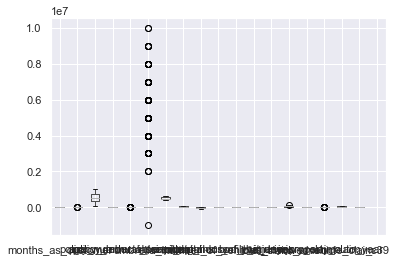

In [35]:
df.boxplot();

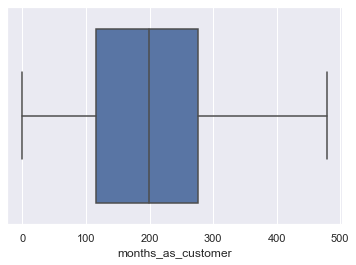

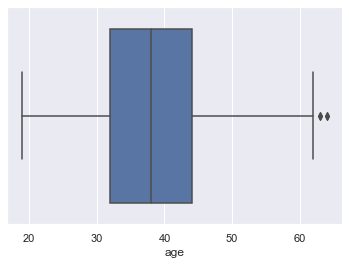

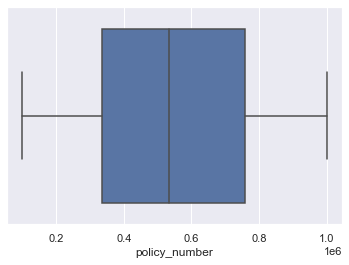

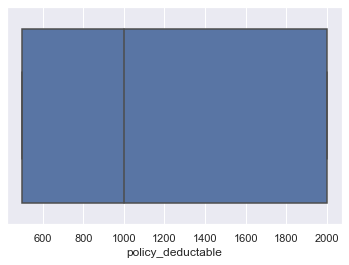

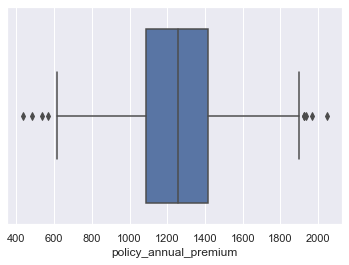

...

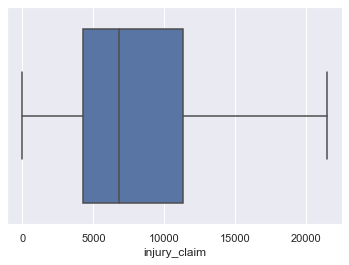

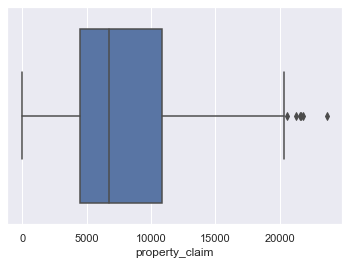

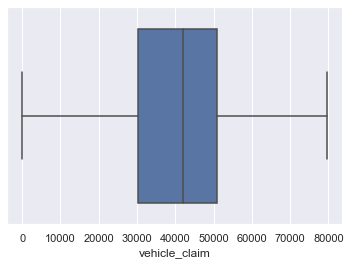

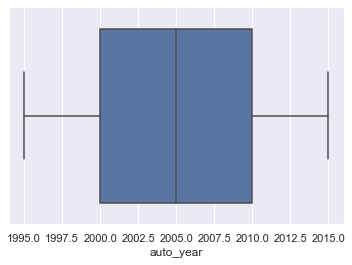

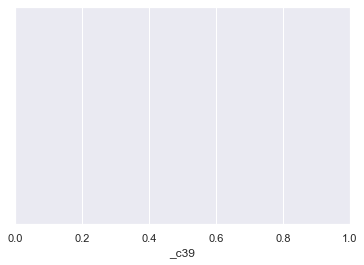

In [36]:
for i in numCol:
    plt.figure()
    sns.boxplot(x=df[i])

In [37]:
Q1=df.quantile(0.25)
Q3=df.quantile(0.75)
IQR=Q3-Q1
print(((df<(Q1-1.5 * IQR)) | (df > (Q3 +1.5 * IQR ))).sum())

_c39                             0
age                              4
authorities_contacted            0
auto_make                        0
auto_model                       0
auto_year                        0
bodily_injuries                  0
capital-gains                    0
capital-loss                     0
collision_type                   0
fraud_reported                   0
incident_city                    0
incident_date                    0
incident_hour_of_the_day         0
incident_location                0
incident_severity                0
incident_state                   0
incident_type                    0
injury_claim                     0
insured_education_level          0
insured_hobbies                  0
insured_occupation               0
insured_relationship             0
insured_sex                      0
insured_zip                      0
months_as_customer               0
number_of_vehicles_involved      0
police_report_available          0
policy_annual_premiu

In [38]:
outNum =[]
for i in numCol:
    q1= df[i].quantile(0.25)
    q3= df[i].quantile(0.75)
    iqr=q3-q1
    upper_limit=q3+1.5*iqr
    lower_limit=q1-1.5*iqr
    outNum.append([i,q1,q3,iqr,lower_limit,upper_limit])
    
    df[i] = np.where(df[i]> upper_limit,upper_limit,
                 np.where(df[i]< lower_limit,lower_limit,
                         df[i]))

In [39]:
pd.DataFrame(outNum,columns=["variableName","Q1","Q3","IQR","lowe_limit","upper_limit"])

,variableName,Q1,Q3,IQR,lowe_limit,upper_limit
0,months_as_customer,115.7500,276.250,160.5000,-125.00000,5.170000e+02
1,age,32.0000,44.000,12.0000,14.00000,6.200000e+01
2,policy_number,335980.2500,759099.750,423119.5000,-298699.00000,1.393779e+06
3,policy_deductable,500.0000,2000.000,1500.0000,-1750.00000,4.250000e+03
4,policy_annual_premium,1089.6075,1415.695,326.0875,600.47625,1.904826e+03
5,umbrella_limit,0.0000,0.000,0.0000,0.00000,0.000000e+00
6,insured_zip,448404.5000,603251.000,154846.5000,216134.75000,8.355208e+05
7,capital-gains,0.0000,51025.000,51025.0000,-76537.50000,1.275625e+05
8,capital-loss,-51500.0000,0.000,51500.0000,-128750.00000,7.725000e+04
9,incident_hour_of_the_day,6.0000,17.000,11.0000,-10.50000,3.350000e+01


# Matplotlib-Pandas

In [42]:
import matplotlib.pyplot as plt
%matplotlib inline

In [43]:
df=pd.read_csv("Automobile.csv")
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


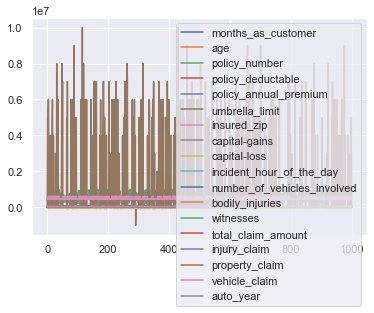

In [45]:
df = pd.read_csv('Automobile.csv')

df.plot()

plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


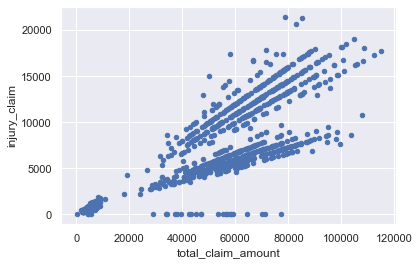

In [51]:
df = pd.read_csv('Automobile.csv')

df.plot(kind = 'scatter', x = 'total_claim_amount', y = 'injury_claim')

plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


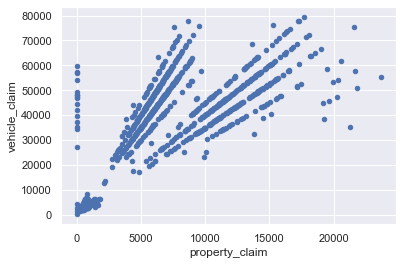

In [52]:
df = pd.read_csv('Automobile.csv')

df.plot(kind = 'scatter', x = 'property_claim', y = 'vehicle_claim')

plt.show()

<AxesSubplot:ylabel='Frequency'>

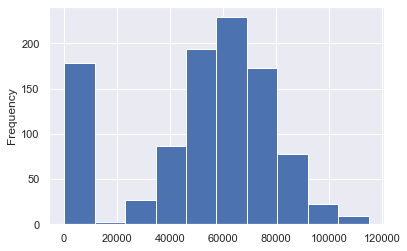

In [53]:
df["total_claim_amount"].plot(kind = 'hist')

<AxesSubplot:ylabel='Frequency'>

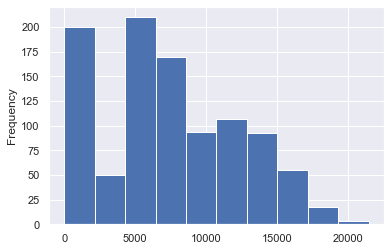

In [54]:
df["injury_claim"].plot(kind = 'hist')

<AxesSubplot:ylabel='Frequency'>

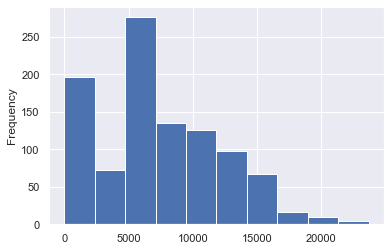

In [55]:
df["property_claim"].plot(kind = 'hist')

<AxesSubplot:ylabel='Frequency'>

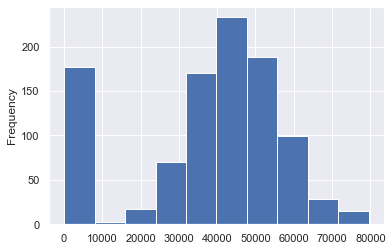

In [56]:
df["vehicle_claim"].plot(kind = 'hist')

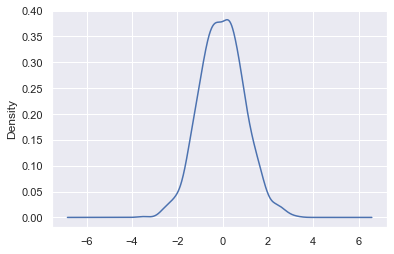

In [59]:
#Density Plot
df = pd.DataFrame(np.random.rand(10, 4),
      columns =['total_claim_amount', 'injury_claim', 'property_claim','vehicle_claim'])
 
ser = pd.Series(np.random.randn(1000))
ser.plot.kde()
 
plt.show()

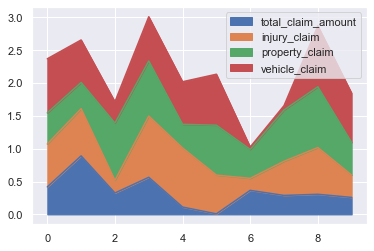

In [61]:
#Area plot using matplotlib
df = pd.DataFrame(np.random.rand(10, 4),
       columns =['total_claim_amount', 'injury_claim', 'property_claim','vehicle_claim'])
 
df.plot.area()
plt.show()

# Heatmap of Dataset

<AxesSubplot:>

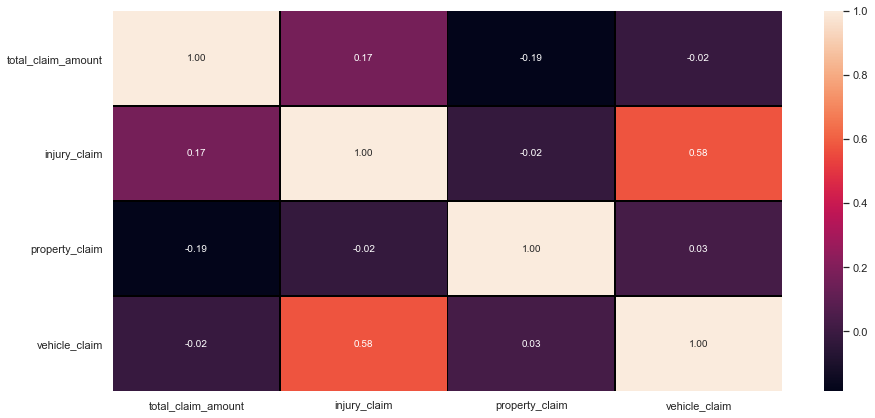

In [62]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(), annot=True, linewidths=0.5,linecolor="black", fmt='.2f')

In [63]:
df.describe()

,total_claim_amount,injury_claim,property_claim,vehicle_claim
count,10.000000,10.000000,10.000000,10.000000
mean,0.354427,0.574398,0.634681,0.567189
std,0.243191,0.265930,0.219165,0.314159
min,0.008558,0.183279,0.360224,0.036399
25%,0.266520,0.385131,0.448692,0.405304
50%,0.316495,0.622031,0.628358,0.661139
75%,0.405841,0.716632,0.824035,0.769308
max,0.891736,0.932375,0.925517,0.926794


In [64]:
df.skew

<bound method NDFrame._add_numeric_operations.<locals>.skew of    total_claim_amount  injury_claim  property_claim  vehicle_claim
0            0.419001      0.653629        0.474025       0.823669
1            0.891736      0.718242        0.399515       0.647399
2            0.326198      0.193412        0.871103       0.324606
3            0.565387      0.932375        0.838337       0.674356
4            0.112170      0.900358        0.360224       0.647922
5            0.008558      0.590432        0.759831       0.776102
6            0.366360      0.183279        0.440248       0.036399
7            0.289054      0.520420        0.781129       0.065718
8            0.306793      0.711802        0.925517       0.926794
9            0.259009      0.340035        0.496885       0.748926>

# Dropping Columns

In [65]:
df.shape

(10, 4)

In [66]:
df.head()

,total_claim_amount,injury_claim,property_claim,vehicle_claim
0,0.419001,0.653629,0.474025,0.823669
1,0.891736,0.718242,0.399515,0.647399
2,0.326198,0.193412,0.871103,0.324606
3,0.565387,0.932375,0.838337,0.674356
4,0.112170,0.900358,0.360224,0.647922


In [67]:
df.tail()

,total_claim_amount,injury_claim,property_claim,vehicle_claim
5,0.008558,0.590432,0.759831,0.776102
6,0.366360,0.183279,0.440248,0.036399
7,0.289054,0.520420,0.781129,0.065718
8,0.306793,0.711802,0.925517,0.926794
9,0.259009,0.340035,0.496885,0.748926


In [69]:
df = pd.read_csv("Automobile.csv")
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [70]:
df=df.drop('policy_state',axis=1)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,250/500,1000,1406.91,0,466132,MALE,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,250/500,2000,1197.22,5000000,468176,MALE,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,100/300,2000,1413.14,5000000,430632,FEMALE,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,250/500,2000,1415.74,6000000,608117,FEMALE,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,500/1000,1000,1583.91,6000000,610706,MALE,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,500/1000,1000,1310.80,0,431289,FEMALE,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,100/300,1000,1436.79,0,608177,FEMALE,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,250/500,500,1383.49,3000000,442797,FEMALE,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,500/1000,2000,1356.92,5000000,441714,MALE,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [71]:
df=df.drop('insured_sex',axis=1)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_education_level,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,250/500,1000,1406.91,0,466132,MD,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,250/500,2000,1197.22,5000000,468176,MD,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,100/300,2000,1413.14,5000000,430632,PhD,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,250/500,2000,1415.74,6000000,608117,PhD,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,500/1000,1000,1583.91,6000000,610706,Associate,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,500/1000,1000,1310.80,0,431289,Masters,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,100/300,1000,1436.79,0,608177,PhD,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,250/500,500,1383.49,3000000,442797,Masters,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,500/1000,2000,1356.92,5000000,441714,Associate,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [72]:
df=df.drop('insured_education_level',axis=1)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_occupation,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,250/500,1000,1406.91,0,466132,craft-repair,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,250/500,2000,1197.22,5000000,468176,machine-op-inspct,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,100/300,2000,1413.14,5000000,430632,sales,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,250/500,2000,1415.74,6000000,608117,armed-forces,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,500/1000,1000,1583.91,6000000,610706,sales,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,500/1000,1000,1310.80,0,431289,craft-repair,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,100/300,1000,1436.79,0,608177,prof-specialty,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,250/500,500,1383.49,3000000,442797,armed-forces,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,500/1000,2000,1356.92,5000000,441714,handlers-cleaners,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [73]:
df=df.drop('insured_occupation',axis=1)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_hobbies,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,250/500,1000,1406.91,0,466132,sleeping,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,250/500,2000,1197.22,5000000,468176,reading,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,100/300,2000,1413.14,5000000,430632,board-games,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,250/500,2000,1415.74,6000000,608117,board-games,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,500/1000,1000,1583.91,6000000,610706,board-games,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,500/1000,1000,1310.80,0,431289,paintball,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,100/300,1000,1436.79,0,608177,sleeping,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,250/500,500,1383.49,3000000,442797,bungie-jumping,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,500/1000,2000,1356.92,5000000,441714,base-jumping,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [102]:
df=df.drop('policy_csl',axis=1)
df=df.drop('incident_severity',axis=1)
df=df.drop('authorities_contacted',axis=1)
df=df.drop('incident_city',axis=1)
df

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim
0,328,48,521585,1000,1406.91,0,466132,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,5,1,1,2,71610,6510,13020,52080
1,228,42,342868,2000,1197.22,5000000,468176,0,0,21-01-2015,Vehicle Theft,?,8,1,0,0,5070,780,780,3510
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,7,3,2,3,34650,7700,3850,23100
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,5,1,1,2,63400,6340,6340,50720
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,17-02-2015,Vehicle Theft,?,20,1,0,1,6500,1300,650,4550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,22-02-2015,Single Vehicle Collision,Front Collision,20,1,0,1,87200,17440,8720,61040
996,285,41,186934,1000,1436.79,0,608177,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,23,1,2,3,108480,18080,18080,72320
997,130,34,918516,500,1383.49,3000000,442797,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,4,3,2,3,67500,7500,7500,52500
998,458,62,533940,2000,1356.92,5000000,441714,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,2,1,0,1,46980,5220,5220,36540


In [103]:
df=df.drop('incident_type',axis=1)
df=df.drop('collision_type',axis=1)
df


,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_date,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim
0,328,48,521585,1000,1406.91,0,466132,53300,0,25-01-2015,5,1,1,2,71610,6510,13020,52080
1,228,42,342868,2000,1197.22,5000000,468176,0,0,21-01-2015,8,1,0,0,5070,780,780,3510
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,22-02-2015,7,3,2,3,34650,7700,3850,23100
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,10-01-2015,5,1,1,2,63400,6340,6340,50720
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,17-02-2015,20,1,0,1,6500,1300,650,4550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,22-02-2015,20,1,0,1,87200,17440,8720,61040
996,285,41,186934,1000,1436.79,0,608177,70900,0,24-01-2015,23,1,2,3,108480,18080,18080,72320
997,130,34,918516,500,1383.49,3000000,442797,35100,0,23-01-2015,4,3,2,3,67500,7500,7500,52500
998,458,62,533940,2000,1356.92,5000000,441714,0,0,26-02-2015,2,1,0,1,46980,5220,5220,36540


In [112]:
df=df.drop('incident_date',axis=1)
df

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,13020,52080
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,780,3510
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,3850,23100
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,6340,50720
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,650,4550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,20,1,0,1,87200,17440,8720,61040
996,285,41,186934,1000,1436.79,0,608177,70900,0,23,1,2,3,108480,18080,18080,72320
997,130,34,918516,500,1383.49,3000000,442797,35100,0,4,3,2,3,67500,7500,7500,52500
998,458,62,533940,2000,1356.92,5000000,441714,0,0,2,1,0,1,46980,5220,5220,36540


# Splitting the dataset into 2 variables namely 'X' and 'Y' for feature and label

In [129]:
X=df.drop('property_claim',axis=1)
Y=df['property_claim']

In [130]:
Y.value_counts()

0        19
860       6
640       5
480       5
10000     5
         ..
5350      1
6700      1
20550     1
4650      1
11260     1
Name: property_claim, Length: 626, dtype: int64

In [131]:
X

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,vehicle_claim
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,52080
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,3510
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,23100
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,50720
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,4550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,20,1,0,1,87200,17440,61040
996,285,41,186934,1000,1436.79,0,608177,70900,0,23,1,2,3,108480,18080,72320
997,130,34,918516,500,1383.49,3000000,442797,35100,0,4,3,2,3,67500,7500,52500
998,458,62,533940,2000,1356.92,5000000,441714,0,0,2,1,0,1,46980,5220,36540


In [132]:
Y

0      13020
1        780
2       3850
3       6340
4        650
       ...  
995     8720
996    18080
997     7500
998     5220
999      920
Name: property_claim, Length: 1000, dtype: int64

# Label Binarization

In [133]:
Y = Y.apply(lambda y_value:1 if y_value>=7 else 0)

In [134]:
Y

0      1
1      1
2      1
3      1
4      1
      ..
995    1
996    1
997    1
998    1
999    1
Name: property_claim, Length: 1000, dtype: int64

In [135]:
X

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,vehicle_claim
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,52080
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,3510
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,23100
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,50720
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,4550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,20,1,0,1,87200,17440,61040
996,285,41,186934,1000,1436.79,0,608177,70900,0,23,1,2,3,108480,18080,72320
997,130,34,918516,500,1383.49,3000000,442797,35100,0,4,3,2,3,67500,7500,52500
998,458,62,533940,2000,1356.92,5000000,441714,0,0,2,1,0,1,46980,5220,36540


In [136]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,vehicle_claim
0,1.078140,0.990836,-0.095953,-0.222383,0.616705,-0.479476,-0.489529,1.011331,0.953851,-0.956261,-0.823865,0.009759,0.461838,0.714257,-0.189283,0.749653
1,0.208995,0.334073,-0.791527,1.412784,-0.242521,1.697980,-0.461008,-0.901927,0.953851,-0.524475,-0.823865,-1.210174,-1.338700,-1.807312,-1.363822,-1.823346
2,-0.608002,-1.088913,0.550566,1.412784,0.642233,1.697980,-0.984885,0.358023,0.953851,-0.668404,1.140056,1.229693,1.362107,-0.686362,0.054644,-0.785565
3,0.452355,0.224613,-1.239334,1.412784,0.652886,2.133471,1.491682,0.853388,-1.267577,-0.956261,-0.823865,0.009759,0.461838,0.403135,-0.224130,0.677607
4,0.208995,0.552994,-0.695834,-0.222383,1.341980,2.133471,1.527808,1.467210,-0.683741,1.202666,-0.823865,-1.210174,-0.438431,-1.753121,-1.257232,-1.768252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-1.746582,-0.103769,1.539740,-0.222383,0.222884,-0.479476,-0.975717,-0.901927,0.953851,1.202666,-0.823865,-1.210174,-0.438431,1.305049,2.051155,1.224309
996,0.704407,0.224613,-1.398429,-0.222383,0.739141,-0.479476,1.492519,1.643100,0.953851,1.634452,-0.823865,1.229693,1.362107,2.111466,2.182342,1.821868
997,-0.642767,-0.541611,1.448920,-1.039966,0.520739,0.826998,-0.815138,0.358023,0.953851,-1.100189,1.140056,1.229693,1.362107,0.558507,0.013648,0.771902
998,2.208028,2.523284,-0.047867,1.412784,0.411866,1.697980,-0.830250,-0.901927,0.953851,-1.388046,-0.823865,-1.210174,-0.438431,-0.219110,-0.453708,-0.073580


# Train & Test for DataSet

In [137]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=21)

# Machine Learning Model

In [138]:
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier


from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 

In [139]:
#Classification of model function
def classify(model, X, Y):
    X_train, X_test, Y_train, Y_test=train_test_split(X,Y,test_size=0.2,random_state=21)
#Training the model
    model.fit(X_train, Y_train)
    pred = model.predict(X_test)
    acc_score=(accuracy_score(Y_test,pred))*100
    print("Accuracy Score:",acc_score)
    class_report=classification_report(Y_test,pred)
    print("\nClassification Report:\n",class_report)
    cv_score=(cross_val_score(model,X,Y,cv=5).mean())*100
    print("Cross Validation Score:",cv_score)
    result=acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is",result)

In [140]:
#Logistic Regression Model
model=LogisticRegression()
classify(model,X,Y)

Accuracy Score: 97.5

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.97      1.00      0.99       195

    accuracy                           0.97       200
   macro avg       0.49      0.50      0.49       200
weighted avg       0.95      0.97      0.96       200

Cross Validation Score: 98.1

Accuracy Score - Cross Validation Score is -0.5999999999999943


In [141]:
#Support Vector Classifier
model=SVC(C=1.0,kernel='rbf',gamma='auto',random_state=42)
classify(model,X,Y)

Accuracy Score: 97.5

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.97      1.00      0.99       195

    accuracy                           0.97       200
   macro avg       0.49      0.50      0.49       200
weighted avg       0.95      0.97      0.96       200

Cross Validation Score: 98.1

Accuracy Score - Cross Validation Score is -0.5999999999999943


In [142]:
#KNeighbors Classifier
model=KNeighborsClassifier(n_neighbors=15)
classify(model,X,Y)

Accuracy Score: 97.5

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.97      1.00      0.99       195

    accuracy                           0.97       200
   macro avg       0.49      0.50      0.49       200
weighted avg       0.95      0.97      0.96       200

Cross Validation Score: 98.1

Accuracy Score - Cross Validation Score is -0.5999999999999943


In [143]:
Final_Model = SVC(decision_function_shape='ovo', gamma='scale', kernel='rbf', probability=True, random_state=21,
                 shrinking=True, verbose=True)
Classifier = Final_Model.fit(X_train, Y_train)
fmod_pred = Final_Model.predict(X_test)
fmod_acc = (accuracy_score(Y_test, fmod_pred))*100
print("Accuracy score for the Best Model is:", fmod_acc)

[LibSVM]Accuracy score for the Best Model is: 97.5


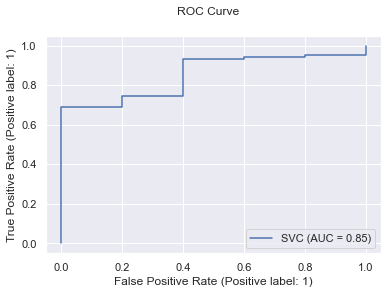

In [144]:
disp = metrics.plot_roc_curve(Final_Model, X_test, Y_test)
disp.figure_.suptitle("ROC Curve")
plt.show()